- summer-average (JJA) SST and anomaly for each historical year.  
- The PGW deltas we are adding.   
- The full PGW SST and anomaly fields that we use in the PGW simulations.

####  High PMM and neutral ENSO:
- 1993 3 (1978-2008)
- 1994 3 (1979-2009)
- 2018 5 (2003-2033)
- 2019 4 (2004-2034)

#### Low PMM and neutral ENSO and at least 1 TC:
- 1984 0 (1969-1999)
- 2005 1 (1990-2020)
- 2008 0 (1993-2023)
- 2012 0 (1997-2027)

Ming Ge Feb. 2025

In [4]:
import glob
import os
from pathlib import Path
import numpy as np
import xarray as xr
import pywinter.winter as pyw
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import scipy.spatial.qhull as qhull
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [5]:
# Interpolation functions
def interp_weights(xy, uv,d=2):
    tri = qhull.Delaunay(xy)
    simplex = tri.find_simplex(uv)
    vertices = np.take(tri.simplices, simplex, axis=0)
    temp = np.take(tri.transform, simplex, axis=0)
    delta = uv - temp[:, d]
    bary = np.einsum('njk,nk->nj', temp[:, :d, :], delta)
    return vertices, np.hstack((bary, 1 - bary.sum(axis=1, keepdims=True)))

def interpolate(values, vtx, wts):
    return np.einsum('nj,nj->n', np.take(values, vtx), wts)

def inter_3d(data_3d, vtx, wts, nlat, nlon):
    '''
    interpolate last 2 dimensions of 3D data_3d
    given vtx, wts
    '''
    data_int = np.zeros((data_3d.shape[0], nlat, nlon))
    for nn in range(data_3d.shape[0]):
        data_int[nn] = interpolate(data_3d[nn].flatten(), vtx, wts).reshape(nlat, nlon)
    return data_int   


In [37]:
def ax_coastlines_country(ax_s):
    ax_s.coastlines(linewidths=0.5)
    ax_s.add_feature(cfeature.NaturalEarthFeature(category='cultural',
                                           name='admin_0_countries',
                                           scale='10m',
                                           facecolor='none',
                                           edgecolor='black',                                      linewidth=0.2))

def plot_sst_p8(sst, levels, title_s, c_map):
    proj = ccrs.Robinson(central_longitude=180)
    fig, axs = plt.subplots(2, 4, figsize=(30,6), dpi=300, subplot_kw={'projection':proj})
     
    axs = axs.flatten()
     
    for col in range(8):
        im = axs[col].contour(sst.longitude, sst.latitude, sst[col],
            colors='black',levels=levels[::2], linewidths=0.5,
            transform=ccrs.PlateCarree())
        imf = axs[col].contourf(sst.longitude, sst.latitude, sst[col],
            cmap = c_map, levels=levels, extend='both',
            transform=ccrs.PlateCarree())

        # draw gridlines 
        axs[col].gridlines()

        # mask land
        axs[col].add_feature(cfeature.LAND, facecolor='lightgrey', zorder=1) 

        
        # draw box of Niño 3.4 (5N-5S, 170W-120W): PPM (20°S-30°N, 175°E-85°W) 
        axs[col].add_patch(mpatches.Rectangle(xy=[175, -20], width=100, height=50,
                                facecolor='None', edgecolor='k', lw = 2,
                                transform=ccrs.PlateCarree()))

        # Draw the coastines for each subplot
        ax_coastlines_country(axs[col])
        
        # Title each subplot with the name of the model
        axs[col].set_title(title_s[col])

    # Add a big title at the top
    plt.suptitle('mean SST (JJA)  ')

    # add common colarbar
    fig.colorbar(imf, ax=axs.ravel().tolist())  


#### Read SST (JJA) of ERA5 

In [7]:
flnm = '/glade/campaign/mmm/c3we/mingge/ERA5/sst_jja_8.nc'
with xr.open_dataset(flnm) as ds_e5:
    lat_e5 = ds_e5.latitude.data
    lon_e5 = ds_e5.longitude.data
    sst_e5 = ds_e5.SSTK
    d_sst = ds_e5.SSTK.copy()
    
n_lat_e5 = len(lat_e5)
n_lon_e5 = len(lon_e5)

# reverse latitude of ERA5
lon_grid_e5, lat_grid_e5 = np.meshgrid(lon_e5, lat_e5[::-1])
lon_grid_e5_flatten = lon_grid_e5.flatten()
lat_grid_e5_flatten = lat_grid_e5.flatten()

# creat LENS2 mesh grid (192, 288)
n_lat_lens2 = 192
n_lon_lens2 = 288
lat_lens2 = np.linspace(-90, 90, n_lat_lens2)
lon_lens2 = np.linspace(0, 358.75, n_lon_lens2)
lon_grid_lens2, lat_grid_lens2 = np.meshgrid(lon_lens2, lat_lens2)
lon_grid_lens2_flatten = lon_grid_lens2.flatten()
lat_grid_lens2_flatten = lat_grid_lens2.flatten()

# create gregridding weights
# Remap LENS2 to ERA5
points = np.array([lon_grid_lens2_flatten, lat_grid_lens2_flatten]).transpose()
vtx, wts = interp_weights(points, np.append(lon_grid_e5_flatten[:,None], lat_grid_e5_flatten[:,None], axis=1))

/glade/derecho/scratch/mingge/tmp/ipykernel_32736/3463467168.py:3: DeprecationWarning: Please import `Delaunay` from the `scipy.spatial` namespace; the `scipy.spatial.qhull` namespace is deprecated and will be removed in SciPy 2.0.0.
  tri = qhull.Delaunay(xy)


#### Read SST of intermediate file format LENS2 through pywinter 

In [8]:
%%time

year_tc = ['1993',     '1994',      '2018',       '2019',      '1984',      '2005',      '2008',      '2012']
year_c = ['1978-2008', '1979-2009', '2003-2033', '2004-2034', '1969-1999', '1990-2020', '1993-2023', '1997-2027']
year_f = ['2070-2100', '2070-2100', '2070-2100', '2070-2100', '2070-2100', '2070-2100', '2070-2100', '2070-2100']
 
n_tc = len(year_tc)

for nt in range(n_tc):
    dir_o = '/glade/campaign/mmm/c3we/mingge/MPAS-PGW/' + year_tc[nt] + '_PGW/'
    
    flnm_f = dir_o + 'FUTURE:'  + year_tc[nt] + '-06-01_00'
    flnm_c = dir_o + 'CURRENT:' + year_tc[nt] + '-06-01_00'

    # future senario
    dir_f = '/glade/campaign/mmm/c3we/mingge/PGW_F/OUTPUT/'
    
    # historical period
    dir_c = '/glade/campaign/mmm/c3we/mingge/PGW_C/OUTPUT/'

    f_f = pyw.rinter(flnm_f)
    f_c = pyw.rinter(flnm_c)

    # differences
    d_skintemp = f_f['SKINTEMP'].val - f_c['SKINTEMP'].val
   
    # interpolation: LENS2 to ERA5 grid
    d_sst[nt] = interpolate(d_skintemp.flatten(), vtx, wts).reshape(n_lat_e5, n_lon_e5)[::-1] 

    #print(d_skintemp_int.shape, type(d_skintemp_int))
     

CPU times: user 576 ms, sys: 140 ms, total: 716 ms
Wall time: 2.01 s


#### 1.1 SST of summer-average (JJA) for each historical year

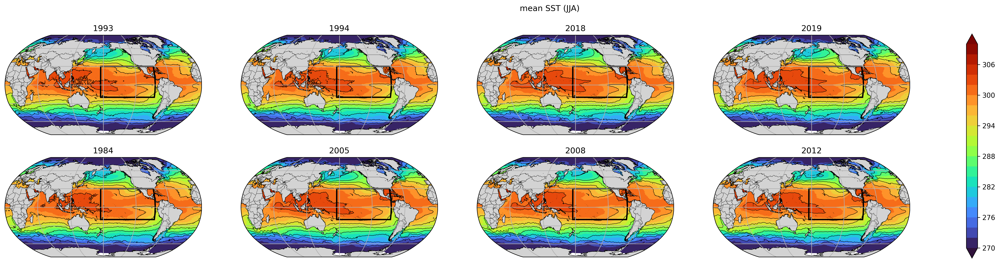

In [38]:
levels = np.linspace(270, 310, num=21)
plot_sst_p8(sst_e5, levels, year_tc, 'turbo')

#### 1.2 SST anomaly of summer-average (JJA) for each historical year

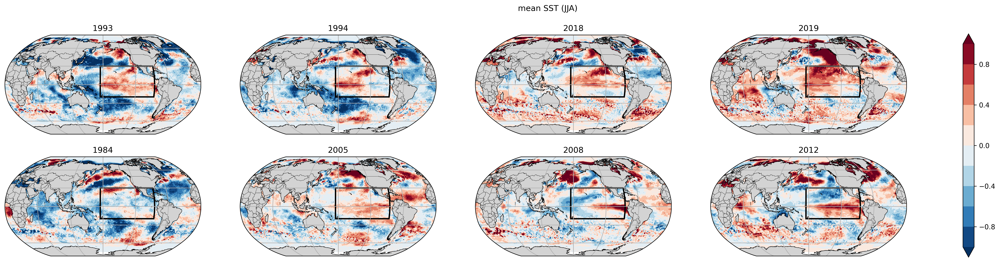

In [35]:
flnm_c = '/glade/campaign/mmm/c3we/mingge/ERA5/sst_jja_1980-2020_cli.nc'
with xr.open_dataset(flnm_c) as ds:
    sst_cli = ds.SSTK 
levels = np.linspace(-1, 1, num=11)
plot_sst_p8(sst_e5-sst_cli, levels, year_tc, 'RdBu_r')

#### 2 The PGW deltas 

In [ ]:
levels = np.linspace(0, 10, num=11)
plot_sst_p8(d_sst, levels, year_tc, 'Reds')

#### 3.1 The full PGW SST fields that we use in the PGW simulations

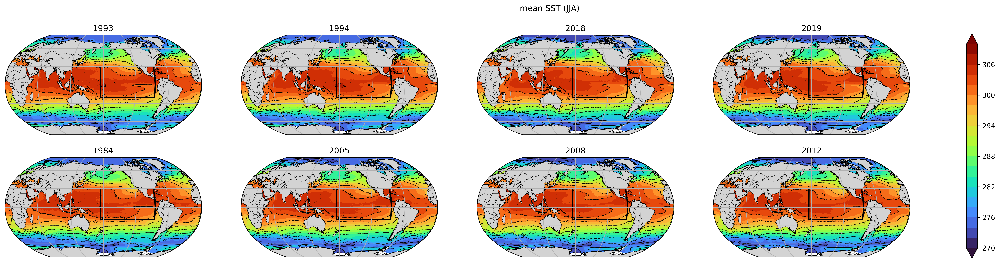

In [39]:
levels = np.linspace(270, 310, num=21)
plot_sst_p8(sst_e5 + d_sst, levels, year_tc, 'turbo')

#### 3.2 The anomally of full PGW SST fields that we use in the PGW simulations

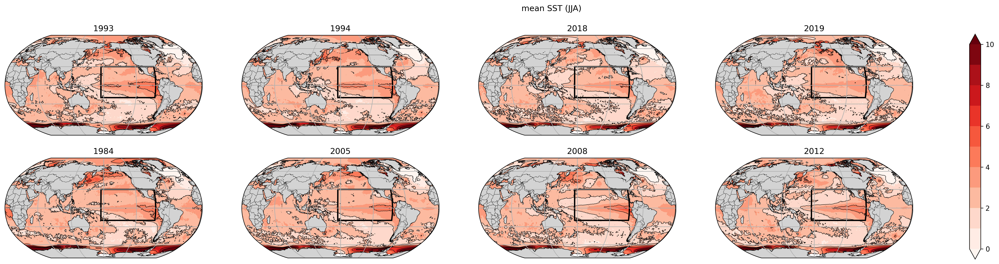

In [40]:
levels = np.linspace(0, 10, num=11)
plot_sst_p8(sst_e5 + d_sst - sst_cli, levels, year_tc, 'Reds')